# Paddock time series multivariate

### Inputs:
- time series sentinel data (xarray object "*ds2.pkl")
      - includes 8 bands and many indices
- paddock polygons (geopackage *filt.gpkg)
- paddock variable time array (numpy array *.npy)
### Steps:

### Outputs:
- plot showing observed and interpolated data for some SI. 
- unordered heatmap of NDVI (or other SI)
- (flip book)for each paddock, an animation of RGB with trace plots of various indices and a moving vline with time steps.
    - save the outputs to file
    - use this to see how SIs change in relation to what can be observed
- (focal paddock comparer) An 'interactive plotter' of a single variable of choice for all paddocks. Select certain paddocks to give unique colours on the map and traceplot.
    - use this to directly compare paddocks.
    - Also show the variable dynamics for the full region (comparing the view of a homogenous grid cell).

## Setup

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import seaborn as sns
import xarray as xr
import matplotlib.pyplot as plt 
import matplotlib

%matplotlib inline

import cv2 
from matplotlib.gridspec import GridSpec
from dea_tools.plotting import display_map, rgb, xr_animation
import skimage

from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.preprocessing import TimeSeriesResampler
from tslearn.clustering import KShape, KernelKMeans, silhouette_score
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans

from IPython.display import Image
from IPython.core.display import Video

import pickle
import os
import shutil

import ffmpeg # REQUIRES a module load ffmpeg/4.3.1 (in jupyterlab, must do when setting up sesh)


### Functions

In [2]:
def create_paddock_xarray(polygons, pvt_array, ds, var_names):
    '''This function takes a set of polygons and a pvt array, 
    and creates an xarray containing the multivariate time series for each paddock.

    What happens with nans?
    '''
    # Ensure the number of paddocks matches
    assert len(polygons) == pvt_array.shape[0], "Number of paddocks must match"

    # Extract time axis from the xarray Dataset
    time_axis = ds.time

    # Create a DataArray for the paddock geometries
    geometry_da = xr.DataArray(polygons.geometry.values, dims=["paddock"], name="geometry")

    # Create DataArray for each band over time
    pvt_da = xr.DataArray(
        pvt_array,
        dims=["paddock", "variable", "time"],
        coords={
            "paddock": polygons.paddock.values,
            "variable": var_names,
            "time": time_axis
        },
        name="pvt"
    )

    # Combine into a single Dataset
    ds_paddocks = xr.Dataset({
        "geometry": geometry_da,
        "pvt": pvt_da
    })

    return ds_paddocks

# # Usage examp
# ds_paddocks = create_paddock_xarray(pol, pvt, ds, var_names)

# # get weekly
# ds_paddocks_weekly = ds_paddocks.resample(time="1W").interpolate("linear")

In [3]:
def plot_variable_time_series(ds_, variable_names, suffix='_pvt_trace'):
    '''plots the time series for a set of variables from a set of polygons
    '''
    num_vars = len(variable_names)
    
    # Create a figure and a set of subplots
    fig, axes = plt.subplots(num_vars, 1, figsize=(6, 2 * num_vars), sharex=True)

    # Check if axes is a single axis or an array of axes
    if num_vars == 1:
        axes = [axes]

    for ax, variable_name in zip(axes, variable_names):
        # Extract the time series data for the specified variable
        variable_data = ds_.pvt.sel(variable=variable_name)

        # Plot the time series for each paddock
        for paddock in variable_data.paddock.values:
            ax.plot(ds_.time, variable_data.sel(paddock=paddock), marker='o', linestyle='-', linewidth=0.5, markersize=2, label=f'Paddock {paddock}')

        ax.set_ylabel(variable_name)
        ax.grid(True)

    #axes[-1].set_xlabel('Time')

    # Rotate x-axis labels
    plt.xticks(rotation=45)

    # Add the legend to the right of the last axis
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Paddock')

    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()
    plt.savefig(outdir + stub + suffix + '.png')

# Usage example
#plot_variable_time_series(ds_combined, ['NDVI', 'EVI', 'LAI', 'SAVI'])


In [4]:

def plot_clustermap(ds_paddocks, variable_name, pol, outdir, stub):
    '''## New version of cluster plot that takes as input a ds_paddocks rather than pvt (weekly or not...)
    '''
    # Check if the variable_name exists in the dataset
    if variable_name not in ds_paddocks.variable.values:
        raise ValueError(f"Variable '{variable_name}' not found in the dataset.")
    
    # Extract the time series for the specified variable for all paddocks
    pt_variable = ds_paddocks.sel(variable=variable_name).pvt.values

    # Interpolate missing values along the time axis (2nd axis)
    pt_variable = np.apply_along_axis(
        lambda x: pd.Series(x).interpolate(method='linear', limit_direction='both').to_numpy(), 
        axis=1, 
        arr=pt_variable
    )

    # Extract the timestamps and convert to Pandas DatetimeIndex
    time_stamps = ds_paddocks.time.values
    time_index = pd.to_datetime(time_stamps)

    # Adjust start date to include January if necessary
    start_date = time_index.min()
    if start_date.month != 1:
        start_date = pd.Timestamp(year=start_date.year, month=1, day=1)
    
    # Ensure January is included in monthly_start
    monthly_start = pd.date_range(start=start_date, end=time_index.max(), freq='MS')

    # Find the closest previous timestamps in the original time_index
    monthly_ticks = []
    for date in monthly_start:
        prior_dates = time_index[time_index <= date]
        if not prior_dates.empty:
            monthly_ticks.append(prior_dates[-1])

    monthly_ticks_str = [str(t)[:10] for t in monthly_ticks]

    # Extract paddock IDs for row names
    row_names = pol['paddock'].astype(str).values

    # Plot heatmap with clustering of the rows
    plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
    g = sns.clustermap(pt_variable, method='average', metric='euclidean', 
                       row_cluster=True, col_cluster=False, cmap='viridis')

    # Get the order of the rows after clustering
    row_order = g.dendrogram_row.reordered_ind

    # Reorder the row names according to the clustering
    ordered_row_names = [row_names[i] for i in row_order]

    # Customize the plot
    g.ax_heatmap.set_xlabel('Time')
    g.ax_heatmap.set_ylabel('Paddock ID')

    # Set the x-tick labels to the closest previous valid timestamp of each month
    tick_positions = [time_index.get_loc(t) for t in monthly_ticks]
    g.ax_heatmap.set_xticks(tick_positions)
    g.ax_heatmap.set_xticklabels(monthly_ticks_str, rotation=45, ha='right')

    # Set the y-tick labels to the ordered paddock IDs
    g.ax_heatmap.set_yticks(np.arange(len(ordered_row_names)) + 0.5)
    g.ax_heatmap.set_yticklabels(ordered_row_names, fontsize=8, rotation=0)


    # Customize the color bar and position it to the right
    g.cax.set_position([1.1, 0.2, 0.03, 0.45])  # [left, bottom, width, height]
    g.cax.set_title(variable_name, pad=10)  # Title above the color bar

    # Save the plot to results
    plt.savefig(outdir + stub + f"_pt-{variable_name}.png")

    # Print the number of missing pixels across all time series for the variable
    print(f'Number of missing pixels across all {variable_name} time series:', np.count_nonzero(np.isnan(pt_variable)))

# Example usage:
# plot_clustermap(ds_paddocks=ds_paddocks, variable_name='NDVI', pol=pol, outdir='/path/to/output/', stub='output_stub')

In [5]:
# Function to extract frames (updated to avoid errors)
def FrameCapture(video, outdir, type): 
    '''breaks an mp4 video into frames and saves them with the frame number.
    Note that the outdir is a temporary directory...'''
    # Path to video file 
    vidObj = cv2.VideoCapture(video) 
  
    # Used as counter variable 
    count = 0
  
    # checks whether frames were extracted 
    success = True
  
    while success: 
        # vidObj object calls read function extract frames 
        success, image = vidObj.read() 
  
        if success and image is not None:
            # Saves the frames with frame-count 
            cv2.imwrite(outdir + type + "_frame%d.jpg" % count, image) 
            count += 1

# Example usage
# FrameCapture(animation_out_ndvi, tmp_dir, "ndvi")

## Setup

In [26]:
os.chdir('/home/106/jb5097/Projects/PaddockTS')

# set output vars
#stub = 'GRANT'
stub = 'MILGA2'
stub = 'MILG_b033_2023'
stub = 'MILG_b033_2017-24'
#stub = 'test4'
outdir = "/g/data/xe2/John/Data/PadSeg/" # best if output is stored in gdata

# Temporary directory for animations, frames and plots
# clear the tmp directory and create anew

tmp_dir = '/scratch/xe2/jb5097/tmp2/'+stub+'/'
shutil.rmtree(tmp_dir, ignore_errors=True)
os.makedirs(tmp_dir)


In [27]:
# Read in the polygons
pol = gpd.read_file(outdir+stub+'_filt.gpkg')

# have to set a paddock id. Preferably do this in earlier step in future... 
pol['paddock'] = range(1,len(pol)+1)
pol['paddock'] = pol.paddock.astype('category')


# Read in the array of paddocks by variables (e.g. bands) by time -- the pvt array
pvt = np.load(outdir+stub+'_pvt.npy')
# pvt = np.load(data_path+stub+'_pvt2.npy')


# Open the satellite data stack
with open(outdir+stub+'_ds2.pkl', 'rb') as handle:
    ds = pickle.load(handle)
ds

# get the variable names:
with open(outdir+stub+'_pvt_vars.pkl', 'rb') as handle:
    var_names = pickle.load(handle)
print('No. vars:',len(var_names))
#var_names

# Resample data weekly
ds_weekly = ds.resample(time="1W").interpolate("linear")

print('No. weeks in time series:', len(ds_weekly.time.values))

No. vars: 23
No. weeks in time series: 363


In [ ]:
## End of setup/

### Create a paddocks xarray object

In [28]:
ds_paddocks = create_paddock_xarray(pol, pvt, ds, var_names)
# get weekly
ds_paddocks_weekly = ds_paddocks.resample(time="1W").interpolate("linear")

In [ ]:
# # Take a year chunk (?)
# the_year = 2020
# ds = ds.sel(time=ds['time.year'] == the_year)
# ds_paddocks = ds_paddocks.sel(time=ds_paddocks['time.year'] == the_year)
# ds_paddocks_weekly = ds_paddocks_weekly.sel(time=ds_paddocks_weekly['time.year'] == the_year)

## Check the data before starting Time Series Analysis

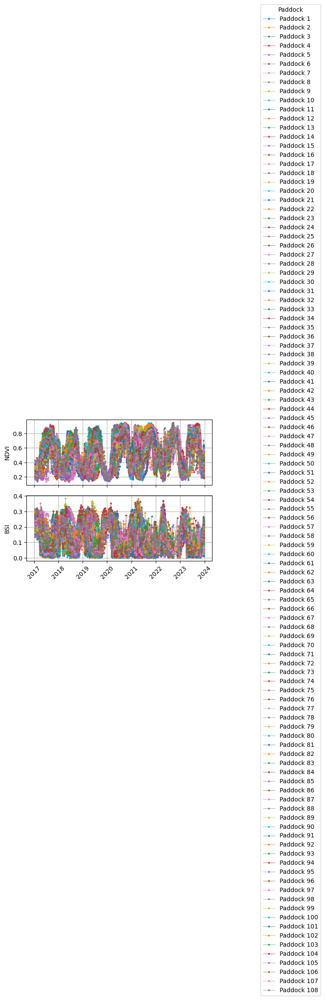

<Figure size 640x480 with 0 Axes>

In [29]:
vars = [ 'NDVI', 'BSI']
plot_variable_time_series(ds_paddocks, vars)


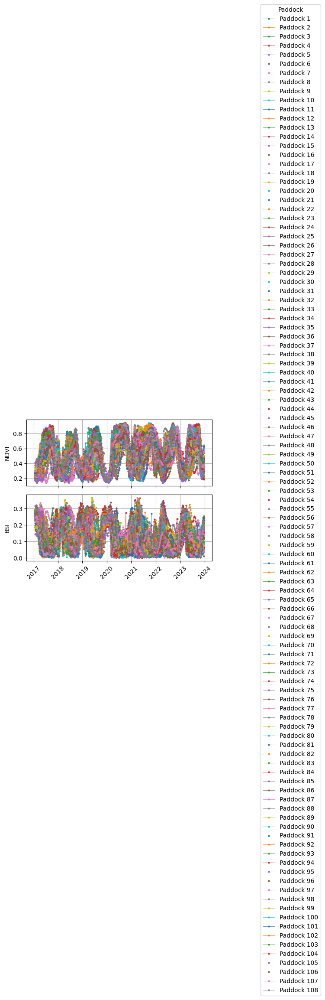

<Figure size 640x480 with 0 Axes>

In [30]:
plot_variable_time_series(ds_paddocks_weekly, vars)

/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Number of missing pixels across all NDVI time series: 0


<Figure size 1000x800 with 0 Axes>

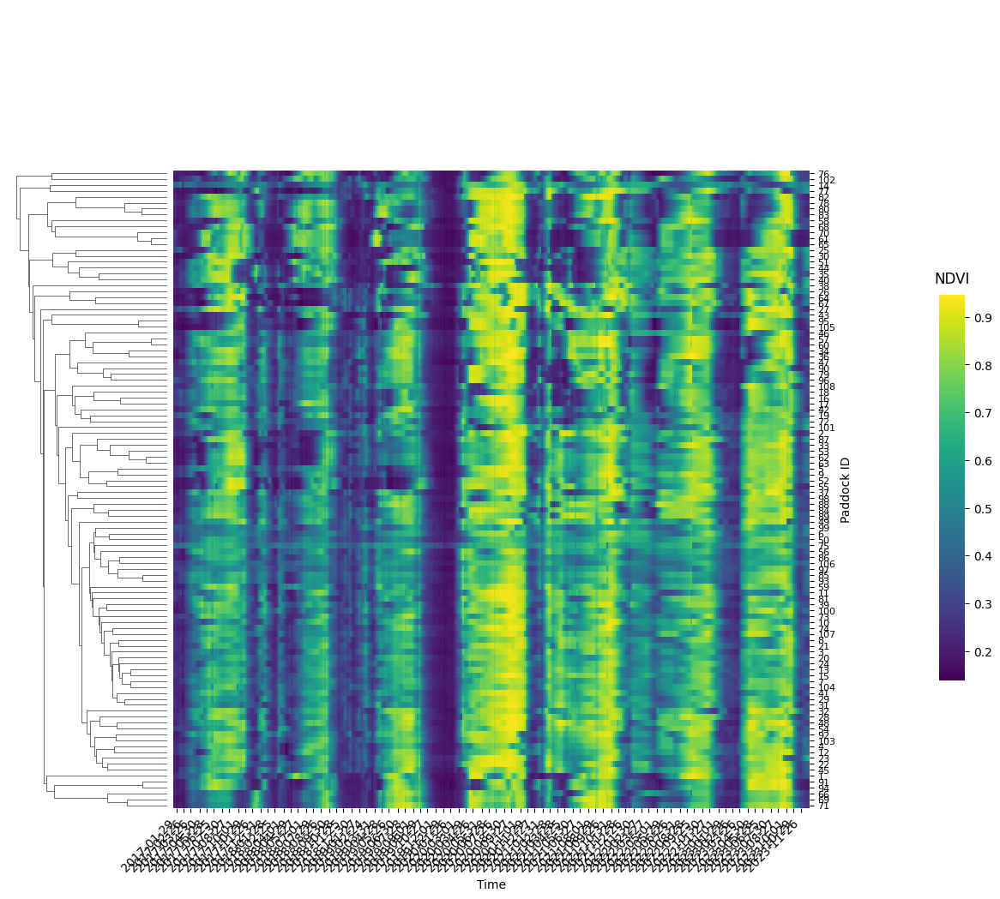

In [31]:
plot_clustermap(ds_paddocks=ds_paddocks_weekly, variable_name='NDVI', pol=pol, outdir=outdir, stub=stub)

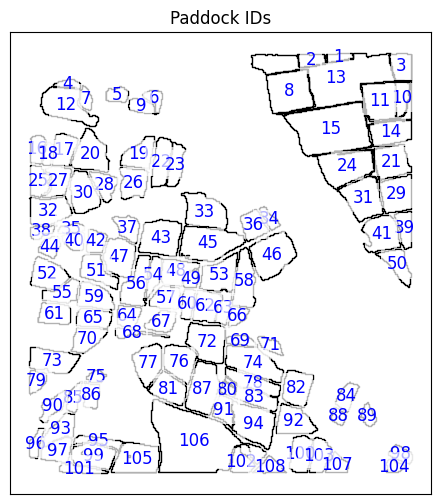

In [32]:
## Plot a map of the paddocks 

# Plot the paddocks
fig, ax = plt.subplots(figsize=(6, 6))
pol.plot(ax=ax, edgecolor='black', facecolor='none')

# Add labels for each paddock
for idx, row in pol.iterrows():
    # Get the centroid of the polygon
    centroid = row['geometry'].centroid
    # Add the text label
    ax.text(centroid.x, centroid.y, str(row['paddock']), 
            fontsize=12, color='blue', ha='center', va='center',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
# Remove axis labels and ticks
ax.set_xticks([])
ax.set_yticks([])
#ax.axis('off')

# Set plot title and show the plot
plt.title('Paddock IDs')
plt.show()

### Load and plot weather data:

variable     rainfall   max_temp   min_temp
date                                       
2020-01-05   1.099854  36.080001  17.940001
2020-01-12   1.899902  33.600001  16.671429
2020-01-19  19.399902  30.228572  17.100001
2020-01-26   4.300049  32.528572  14.700000
2020-02-02   0.199951  36.714286  19.971429
...               ...        ...        ...
2024-03-31   0.000000  28.900000   8.771429
2024-04-07  71.199463  20.928572  11.471429
2024-04-14   0.899902  20.557143   4.000000
2024-04-21   1.000000  21.242858   4.414286
2024-04-28   0.000000  20.550000   4.950000

[226 rows x 3 columns]


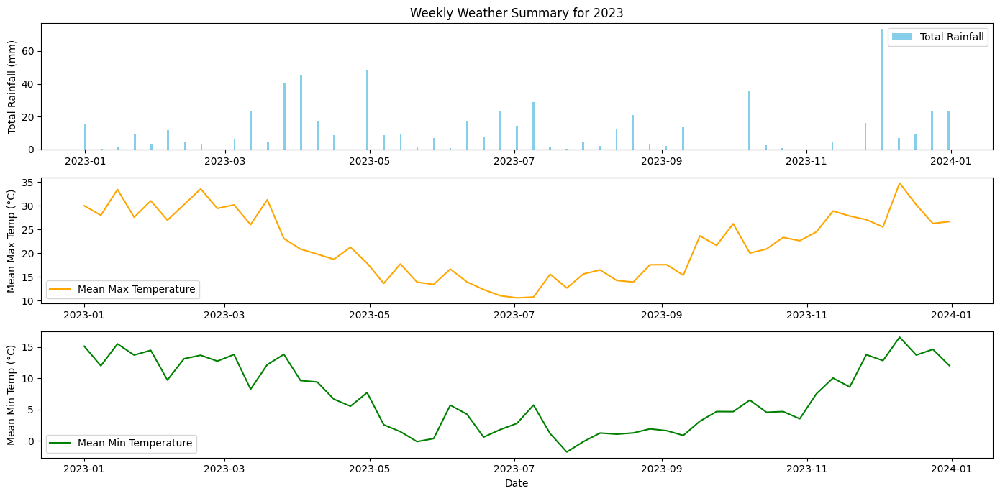

In [33]:

# Load the data
with open(outdir+'milgdarra_rain_mintemp_maxtemp_2020_2024.pickle', 'rb') as file:
    df = pickle.load(file)

# Step 1: Transpose the DataFrame
df = df.transpose()

# Step 2: Remove '_1' from the index
df.index = df.index.str.replace('_1', '', regex=False)

# Step 3: Reset index and melt the DataFrame to long format
df = df.reset_index().melt(id_vars='index', var_name='variable', value_name='value')
df.columns = ['date', 'variable', 'value']

# Step 4: Convert 'date' to datetime and set it as the index
df['date'] = pd.to_datetime(df['date'], format='%y-%m-%d')

# Step 5: Pivot to have columns for each variable
df = df.pivot(index='date', columns='variable', values='value')

# Step 6: Ensure the index is a DatetimeIndex (it should already be, but just in case)
df.index = pd.to_datetime(df.index)

# Step 7: Resample data weekly
weekly_df = df.resample('W').agg({
    'rainfall': 'sum',
    'max_temp': 'mean',
    'min_temp': 'mean'
})

# Display the result
print(weekly_df)

# Step 7: Filter data for the specified year (e.g., 2020)
year = 2023
weekly_df = weekly_df[weekly_df.index.year == year]

# Step 8: Plot the data
plt.figure(figsize=(14, 7))

plt.subplot(3, 1, 1)
plt.bar(weekly_df.index, weekly_df['rainfall'], label='Total Rainfall', color='skyblue')
plt.title(f'Weekly Weather Summary for {year}')
plt.ylabel('Total Rainfall (mm)')
plt.legend()
plt.subplot(3, 1, 2)
plt.plot(weekly_df.index, weekly_df['max_temp'], label='Mean Max Temperature', color='orange')
plt.ylabel('Mean Max Temp (°C)')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(weekly_df.index, weekly_df['min_temp'], label='Mean Min Temperature', color='green')
plt.ylabel('Mean Min Temp (°C)')
plt.xlabel('Date')
plt.legend()

plt.tight_layout()
plt.show()


### Generate new indices based on the weekly, paddock-level data. 
TO DO:
- some sort of cellulose absorbtion index
- difference in NDVI between t and t-X
- NDWI (water index didnt work coming from DEA)
- bare soil index again
- Yellowness (canola flowering)

In [34]:

def add_ndyi(ds):
    """
    Add the Normalized Yellow Index (NYI) to the dataset and retain the geometry data variable.
    
    Parameters:
    ds (xarray.Dataset): The input xarray dataset with dimensions (paddock, variable, time)
    
    Returns:
    xarray.Dataset: The dataset with the additional NYI variable and geometry.
    """
    # Extract the blue and green bands
    blue = ds.sel(variable='nbart_blue').pvt
    green = ds.sel(variable='nbart_green').pvt
    
    # Calculate the Normalized Yellow Index (NYI)
    ndyi = (green - blue) / (blue + green)
    
    # Expand dimensions of NYI to match the original dataset structure
    ndyi_expanded = ndyi.expand_dims(variable=['NDYI'], axis=1)
    
    # Concatenate NYI along the variable dimension
    ds_new = xr.concat([ds.pvt, ndyi_expanded], dim='variable').to_dataset(name='pvt')
    
    # Add the geometry data variable to the new dataset
    ds_new['geometry'] = ds['geometry']
    
    return ds_new

# Example usage
# updated_ds = add_normalized_yellow_index(ds_paddocks_weekly)


In [35]:
def add_nirv(ds):
    """
    Add the NIRv index to the dataset and retain the geometry data variable.
    
    Parameters:
    ds (xarray.Dataset): The input xarray dataset with dimensions (paddock, variable, time)
    
    Returns:
    xarray.Dataset: The dataset with the additional NIRv variable and geometry.
    """
    # Extract the NDVI and NIR bands
    ndvi = ds.sel(variable='NDVI').pvt
    nir = ds.sel(variable='nbart_nir_1').pvt
    
    # Calculate the NIRv index
    nirv = ndvi * nir
    
    # Expand dimensions of NIRv to match the original dataset structure
    nirv_expanded = nirv.expand_dims(variable=['NIRv'], axis=1)
    
    # Concatenate NIRv along the variable dimension
    ds_new = xr.concat([ds.pvt, nirv_expanded], dim='variable').to_dataset(name='pvt')
    
    # Add the geometry data variable to the new dataset
    ds_new['geometry'] = ds['geometry']
    
    return ds_new

In [36]:
import xarray as xr

def calculate_indices(ds, indices):
    """
    Calculate multiple indices and add them to the dataset, retaining the geometry data variable.
    
    Parameters:
    ds (xarray.Dataset): The input xarray dataset with dimensions (paddock, variable, time)
    indices (dict): A dictionary where keys are the names of the indices to be added, 
                    and values are functions that calculate the index.
    
    Returns:
    xarray.Dataset: The dataset with the additional indices and geometry.
    """
    new_bands = []

    for index_name, index_func in indices.items():
        # Calculate the index
        index_data = index_func(ds)
        
        # Expand dimensions of the new index to match the original dataset structure
        index_expanded = index_data.expand_dims(variable=[index_name], axis=1)
        
        # Append the new index to the list
        new_bands.append(index_expanded)
        print(index_name, 'has shape: ', index_data.shape)
    
    # Concatenate all new indices along the variable dimension
    new_bands_concat = xr.concat([ds.pvt] + new_bands, dim='variable').to_dataset(name='pvt')
    
    # Add the geometry data variable to the new dataset
    new_bands_concat['geometry'] = ds['geometry']
    
    return new_bands_concat

# Define the index calculation functions
def calculate_ndyi(ds):
    '''Yellowness index
    suggested to identify flowering of canola and other yellow-flowered plants
    https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/ndyi/
    '''
    blue = ds.sel(variable='nbart_blue').pvt
    green = ds.sel(variable='nbart_green').pvt
    ndyi = (green - blue) / (blue + green)
    return ndyi

def calculate_nirv(ds):
    '''Near Infrared Reflectance of Vegetation
    '''
    ndvi = ds.sel(variable='NDVI').pvt
    nir = ds.sel(variable='nbart_nir_1').pvt
    nirv = ndvi * nir
    return nirv


def calculate_ndti(ds):
    """ Normalized Difference Tillage Index (NDTI).
    NDTI = (R1610−R2200)/(R1610 + R2200)
    Described here and ref within: https://www.mdpi.com/2072-4292/13/18/3718 
    """
    # Extract the SWIR1 and SWIR2 bands
    swir1 = ds.sel(variable='nbart_swir_2').pvt
    swir2 = ds.sel(variable='nbart_swir_3').pvt
    
    # Calculate the NDTI
    ndti = (swir1 - swir2) / (swir1 + swir2)
    
    return ndti

def calculate_cai(ds):
    """Cellulose Absorption Index (CAI).
    CAI = (0.5∗(R2000 +R2200))−R2100
    see https://www.mdpi.com/2072-4292/13/18/3718 
    see also for calibration/nuance with Sentinel data: https://www.spiedigitallibrary.org/conference-proceedings-of-spie/11155/2533761/Identification-of-non-photosynthetic-vegetation-areas-in-Sentinel-2-satellite/10.1117/12.2533761.full
    """
    # Extract the SWIR1, SWIR2, and NIR bands
    swir1 = ds.sel(variable='nbart_swir_2').pvt
    swir2 = ds.sel(variable='nbart_swir_3').pvt
    nir = ds.sel(variable='nbart_nir_1').pvt
    
    # Calculate the CAI
    cai = 0.5 * (swir1 + swir2) - nir
    
    return cai

# # Example usage
# indices = {
#     'NDYI': calculate_ndyi,
#     'NIRv': calculate_nirv
# }

# updated_ds = calculate_indices(ds_paddocks_weekly, indices)
# print(updated_ds.variable)


In [37]:
# Update the indices in paddocks weekly
indices = {
    'NDYI': calculate_ndyi,
    'NIRv': calculate_nirv,
    'NDTI2': calculate_ndti,
    'CAI': calculate_cai
}

ds_paddocks_weekly2 = calculate_indices(ds_paddocks_weekly, indices)
ds_paddocks_weekly2.variable.values

NDYI has shape:  (108, 363)
NIRv has shape:  (108, 363)
NDTI2 has shape:  (108, 363)
CAI has shape:  (108, 363)


array(['nbart_blue', 'nbart_green', 'nbart_red', 'nbart_red_edge_1',
       'nbart_red_edge_2', 'nbart_red_edge_3', 'nbart_nir_1',
       'nbart_nir_2', 'nbart_swir_2', 'nbart_swir_3', 'NDVI', 'kNDVI',
       'EVI', 'LAI', 'SAVI', 'MSAVI', 'NDMI', 'NDWI', 'MNDWI', 'NBR',
       'NDCI', 'NDTI', 'BSI', 'NDYI', 'NIRv', 'NDTI2', 'CAI'],
      dtype=object)

## Create RGB and NDVI animations to go along side paddock time series:

In [44]:
# Set which xarray datasets to use for the rest of the script (weekly or not)
# Repeat from here whenever the focal paddock is changed

# 15 - No. 4 (Manning Wheat 2020)
# 31 - Johnny's (Yiddish Oats 2020)
# 42 - Washpool partial (W/T Wheat 2020)
# 40 + 37 - East Washpool partial (971 Canola 2020)

FOCAL_PADDOCK = 58
weekly = True

if weekly:
    ds_ = ds_weekly
    ds_pad = ds_paddocks_weekly2 # this takes the version with updated indices
elif weekly == False:
    ds_ = ds
    ds_pad = ds_paddocks

# colour paddock of interest in red
# other paddocks in blue
pol['color_edge'] = 'b'
pol.loc[FOCAL_PADDOCK-1, "color_edge"] = 'r'
# Set color for polygon fill (fully transparent)
pol["color"] = 'None' 


In [45]:


# Create NDVI animation 
animation_out_ndvi = tmp_dir+stub+'_ndvi.mp4'
lim =len(ds_.time)

xr_animation(ds_, 
             bands=["NDVI"], 
             output_path = animation_out_ndvi, 
             #show_gdf = pol.loc[pol['paddock'] == 1], 
             show_gdf = pol, 
             gdf_kwargs={"edgecolor": pol['color_edge']},
             imshow_kwargs={"cmap": "Greens", "vmin": 0.0, "vmax": 1.0},
             limit = lim
            )
plt.close()
#Video(animation_out_ndvi, embed=True)

# Create RGB animation
animation_out_rgb = tmp_dir+stub+'_rgb.mp4'

xr_animation(ds_, 
             bands=['nbart_red', 'nbart_green', 'nbart_blue'], 
             output_path = animation_out_rgb, 
             show_gdf = pol, 
             gdf_kwargs={"edgecolor": pol['color_edge']},
             limit = lim
            )
plt.close()
#Video(animation_out_rgb, embed=True)

/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/dea_tools/plotting.py:502: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  gdf[time_col] = pd.to_datetime(gdf[time_col], errors='ignore')
/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/dea_tools/plotting.py:502: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  gdf[time_col] = pd.to_datetime(gdf[time_col], errors='ignore')


Exporting animation to /scratch/xe2/jb5097/tmp2/MILG_b033_2017-24/MILG_b033_2017-24_ndvi.mp4


  0%|          | 0/363 (0.0 seconds remaining at ? frames/s)

/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/dea_tools/plotting.py:502: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  gdf[time_col] = pd.to_datetime(gdf[time_col], errors='ignore')
/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/dea_tools/plotting.py:502: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  gdf[time_col] = pd.to_datetime(gdf[time_col], errors='ignore')


Exporting animation to /scratch/xe2/jb5097/tmp2/MILG_b033_2017-24/MILG_b033_2017-24_rgb.mp4


  0%|          | 0/363 (0.0 seconds remaining at ? frames/s)

/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/g/data/xe2/John/geospatenv/lib64/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/g/d

In [46]:
# Select which variables to plot
vars = ['NDVI','NIRv','NDYI','NDTI2','CAI']

print(vars)
N_INDICES = len(vars)

# check ds_weekly and ds_paddocks_weekly
print(len(ds_.time) == len(ds_pad.time))
len(ds_.time)

n_frame = len(ds_.time)
#n_frame = 5 # for testing purposes, use just 5 frames

print("No. frames to plot:", n_frame)
print('focal paddock ID:', FOCAL_PADDOCK)

['NDVI', 'NIRv', 'NDYI', 'NDTI2', 'CAI']
True
No. frames to plot: 363
focal paddock ID: 58


rm: cannot remove '/scratch/xe2/jb5097/tmp2/MILG_b033_2017-24/multi_frame%d.jpg': No such file or directory
plotting frame  0 of 363
plotting frame  10 of 363
plotting frame  20 of 363


/jobfs/117320877.gadi-pbs/ipykernel_554833/555672667.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize = (14,6))


plotting frame  30 of 363
plotting frame  40 of 363
plotting frame  50 of 363
plotting frame  60 of 363
plotting frame  70 of 363
plotting frame  80 of 363
plotting frame  90 of 363
plotting frame  100 of 363
plotting frame  110 of 363
plotting frame  120 of 363
plotting frame  130 of 363
plotting frame  140 of 363
plotting frame  150 of 363
plotting frame  160 of 363
plotting frame  170 of 363
plotting frame  180 of 363
plotting frame  190 of 363
plotting frame  200 of 363
plotting frame  210 of 363
plotting frame  220 of 363
plotting frame  230 of 363
plotting frame  240 of 363
plotting frame  250 of 363
plotting frame  260 of 363
plotting frame  270 of 363
plotting frame  280 of 363
plotting frame  290 of 363
plotting frame  300 of 363
plotting frame  310 of 363
plotting frame  320 of 363
plotting frame  330 of 363
plotting frame  340 of 363
plotting frame  350 of 363
plotting frame  360 of 363


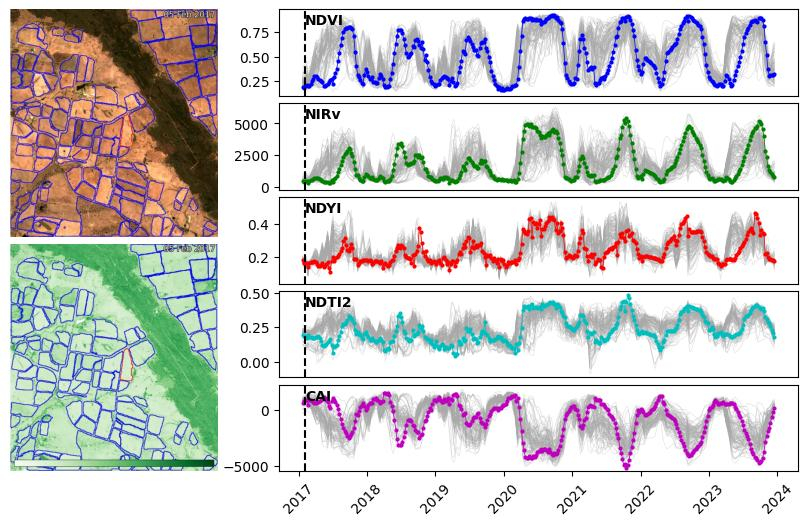

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

<Figure size 1400x600 with 0 Axes>

In [47]:
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '#FFA500', '#800080', '#00FFFF', '#FF6347', '#4682B4', '#DA70D6', '#8B0000', '#ADFF2F', '#FFD700']

# Create the single frame in the tmp directory:
FrameCapture(animation_out_rgb, tmp_dir, "rgb")
FrameCapture(animation_out_ndvi, tmp_dir, "ndvi")

# Delete all frame outputs that may already exist in directory
! rm {tmp_dir+"multi_frame%d.jpg"}

for n in range(n_frame):
    if (n % 10 == 0):
        print("plotting frame ", n, "of", n_frame)
    
    fig = plt.figure(figsize = (14,6))
    gs = GridSpec(N_INDICES*2,4)
    axes = {}
    ax = 'ax'

    # create first two axes
    # RGB image 
    ax1 = fig.add_subplot(gs[:N_INDICES,1:2])
    img_rgb = plt.imread(tmp_dir+"rgb_frame%d.jpg" % n)
    ax1.imshow(img_rgb)
    ax1.axis('off')
    
    # NDVI image
    ax2 = fig.add_subplot(gs[N_INDICES:,1:2])
    img_ndvi = plt.imread(tmp_dir+"ndvi_frame%d.jpg" % n)
    ax2.imshow(img_ndvi)
    ax2.axis('off')
    
    # Plot all the graphs of the indices
    for k in range(N_INDICES):

        variable_name = vars[k]
        
        height_min = 2*k
        height_max = 2*k + 2
        
        # Create axis 'ax+k'
        locals()[ax+str(k)] = fig.add_subplot(gs[height_min:height_max,2:])
        axes[k] = locals()[ax+str(k)]

        ts = ds_pad.pvt.sel(variable=variable_name)[FOCAL_PADDOCK-1].values
        ts_allpads = ds_pad.pvt.sel(variable=variable_name).values

        min_value = np.min(ts)
        max_value = np.max(ts)
        # mid_value = round((min_value + max_value) / 2)
        # mid_date = dfs[0].datetime[round(dfs[0].datetime.shape[0]/2)]
        
        # plot band k for all paddocks
        for trace in ts_allpads:
            axes[k].plot(ds_pad.time, trace, color='darkgrey', linewidth=0.5, alpha = 0.3)
        
        # Plot band k for current paddock
        axes[k].plot(ds_pad.time, ts, colors[k], marker='o', linestyle='-', linewidth=0.5, markersize=2)

        # Plot line for current timestep
        date = ds_pad.time.values[n] #testing
        #axes[k].plot([date,date],[min_value,max_value], color = 'black')
        axes[k].axvline(date, color='black', linestyle='--') # should be equiv of above

        axes[k].text(0.05, 0.95, variable_name, transform=axes[k].transAxes, fontsize=10, fontweight='bold', verticalalignment='top')
        # plt.xticks(fontsize=10)
        # plt.yticks(fontsize=10)
        if (k < N_INDICES - 1):
            axes[k].set_xticks([])
    
    for k in range(len(axes)):
        if k < N_INDICES - 1:
            axes[k].set_xticks([])
        else:
            # Rotate x-axis text for the bottom plot
            axes[k].tick_params(axis='x', rotation=45)
        # Save plot

    plt.savefig(tmp_dir+"multi_frame%d.jpg" % n, bbox_inches="tight")
    plt.clf()

Image(tmp_dir+"multi_frame3.jpg")

### Convert plots back to animation

In [48]:
# Changed this block so we can pass python variables into the command line:
# Also, have to remove the outfile, otherwise get asked whether to overwrite...

infiles = tmp_dir+"multi_frame%d.jpg"
outfile = outdir+stub+"_multiplot_p"+str(FOCAL_PADDOCK)+".mp4"

print(infiles, outfile)

! rm {outfile}
! ffmpeg -framerate 4 -i {infiles} -c:v libx264 -vf "pad=ceil(iw/2)*2:ceil(ih/2)*2" -r 30 {outfile} 

# -vf filter is needed because otherwise throws a "width not divisible by 2" error

# EXAMPLE:
# # pass variable into shell command
# message = "hello from Python"
# !echo {message}


/scratch/xe2/jb5097/tmp2/MILG_b033_2017-24/multi_frame%d.jpg /g/data/xe2/John/Data/PadSeg/MILG_b033_2017-24_multiplot_p58.mp4
rm: cannot remove '/g/data/xe2/John/Data/PadSeg/MILG_b033_2017-24_multiplot_p58.mp4': No such file or directory
ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 8 (GCC)
  configuration: --prefix=/apps/ffmpeg/4.3.1 --enable-gpl --extra-libs=-lpthread --extra-libs=-lm --extra-libs=-ldl --extra-libs=-lnuma --enable-libfreetype --enable-libmp3lame --enable-libopus --enable-libvpx --enable-libx264 --enable-libx265 --ld=g++
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, image2, from '/scratch/xe2/jb5097/tmp2/MILG_b033_2017-24/multi_frame%d.jpg':
  

In [49]:
# View final video
Video(outfile, embed = True)

### Calendar plots over multiple years for focal paddocks
TO DO
Give a list of paddocks. 
For each paddock:
    clip the ds to the paddock with some small buffer
    mask outside the paddock, or not...?
    use the weekly resampled ds to plot calendar plots, with rows as years. 
    save calendar plots. 

In [ ]:

# THis cell ready to convert into a loop over all paddocks to make zoomed in animation.. 
# Plot animation of just first paddock
i = 6

pol['color_edge'] = 'b' # color all the paddocks blue
pol.loc[i-1, "color_edge"] = 'r' # color the ith paddock red

print(pol.head)

bounds = pol.loc[pol['paddock'] == i].geometry.bounds

bu = 100
min_lon = bounds.values[0][0] - bu
min_lat = bounds.values[0][1] - bu
max_lon = bounds.values[0][2] + bu
max_lat = bounds.values[0][3] + bu
    
ds_padded = ds.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
ds_padded

# Create zoomed in RGB animation
animation_out = tmp_dir+stub+'_rgb_paddock_'+str(i)+'.mp4'

# Set color for polygon fill (fully transparent)
pol["color"] = 'None' 

xr_animation(ds_padded, 
             bands=['nbart_red', 'nbart_green', 'nbart_blue'], 
             output_path = animation_out, 
             show_gdf = pol.loc[pol['paddock'] == i], 
             gdf_kwargs={"edgecolor": pol['color_edge']},
             limit = lim
            ) # colouring the focal plot doesnt work with ds_pad, for some reason.. 

plt.close()
Video(animation_out, embed=True)